# NFT metadata & digital scarcity with Fidenza collection

Included in this notebook:
- Crawling token metadata from token URIs
- Checking data quality & text cleaning
- Experiment with feature rarity scores

## 1. Metadata extraction

In [3]:
import numpy as np
import pandas as pd
import os

In [4]:
import requests # to crawl data
import json # to change string to dictionary

In [5]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

#### 1. Crawl data using token URIs:

Create an empty dataframe:

In [4]:
meta_df = pd.DataFrame(columns = ['token_id', 'token_meta'])
meta_df

,token_id,token_meta


Set project's base URI (get from project's smart contract) & token id range:

In [5]:
baseURI = 'https://token.artblocks.io/'

# token id range
first_token_id = 78000000
last_token_id = 78000998
token_id_range = np.arange(first_token_id, (last_token_id + 1))

Iterate through token id range & extract metadata in text format:

In [6]:
for token in token_id_range:
    # concat token url
    url = baseURI + str(token)
        
    # get metadata
    token_metadata = requests.get(url).text
    
    # write to dataframe
    meta_df.loc[len(meta_df),['token_id', 'token_meta']] = [token, token_metadata]

#### 2. Check the results:
- Find missing values or errors (eg. request timed out).
- Redownload data for the missing tokens (if any).

In [7]:
meta_df

,token_id,token_meta
0,78000000,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
1,78000001,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
2,78000002,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
3,78000003,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
4,78000004,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
5,78000005,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
6,78000006,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
7,78000007,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
8,78000008,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."
9,78000009,"{""platform"":""Art Blocks Curated"",""tokenID"":""78..."


In [10]:
# there was an error with token 78000048. Send request again for this token
meta_df.iloc[48, 1] = requests.get('https://token.artblocks.io/78000048').text

In [ ]:
# # double check if needed
# meta_df

#### 3. Clean the text

Now we have all the metadata in place, cleaning steps are as follow:
- Extract all features from the raw text
- Change the text format to dictionary type for easy indexing
- Call the keys of the dictionary (corresponding to the features) to get values, then put them in separate column

*Note: Metadata structure differs across projects. Ajust the text indexes accordingly.*

##### Extract all features 

In [12]:
meta_df['token_all_features'] = meta_df['token_meta'].str.split('{').str[4].str[:-12]

In [13]:
meta_df.head(3)

,token_id,token_meta,token_all_features
0,78000000,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","""Scale"":""Large"",""Colors"":""Golf Socks"",""Spiral""..."
1,78000001,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","""Scale"":""Jumbo"",""Colors"":""Luxe"",""Spiral"":""No"",..."
2,78000002,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","""Scale"":""Jumbo"",""Colors"":""White Mono"",""Spiral""..."


##### Change the text to dictionary type

In [14]:
meta_df['token_all_features'] = meta_df['token_all_features'].apply(lambda x: json.loads('{' + x + '}'))
meta_df.head(3)

,token_id,token_meta,token_all_features
0,78000000,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Large', 'Colors': 'Golf Socks', 'Sp..."
1,78000001,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Jumbo', 'Colors': 'Luxe', 'Spiral':..."
2,78000002,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Jumbo', 'Colors': 'White Mono', 'Sp..."


##### Take feature values to separate columns

In [15]:
# get feature names
feature_names = meta_df.iloc[0,2].keys()
feature_names

dict_keys(['Scale', 'Colors', 'Spiral', 'Density', 'Outlined', 'Turbulence', 'Have Margin', 'Soft Shapes', 'Shape Angles', 'Super Blocks', 'Collision Check'])

In [16]:
for feature in feature_names:
    meta_df[feature] = meta_df.loc[:, 'token_all_features'].apply(lambda x: x[feature])

In [17]:
meta_df.head(3)

,token_id,token_meta,token_all_features,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check
0,78000000,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Large', 'Colors': 'Golf Socks', 'Sp...",Large,Golf Socks,No,Medium,No,Med,Yes,No,Curved,Yes,No Overlap
1,78000001,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Jumbo', 'Colors': 'Luxe', 'Spiral':...",Jumbo,Luxe,No,High,No,Med,No,No,Curved,No,No Overlap
2,78000002,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Jumbo', 'Colors': 'White Mono', 'Sp...",Jumbo,White Mono,No,High,No,None,No,No,Curved,No,No Overlap


**Text cleaning - Summary**

In [18]:
print(' Raw metadata: \n', meta_df.iloc[0,1])
print('\n Features extracted: \n', meta_df.iloc[0,2])
print('\n Clean data ready to use:')
meta_df.drop(columns=['token_meta', 'token_all_features']).head(3)

 Raw metadata: 
 {"platform":"Art Blocks Curated","tokenID":"78000000","series":3,"animation_url":"https://generator.artblocks.io/78000000","image":"https://media.artblocks.io/78000000.png","external_url":"https://artblocks.io/token/78000000","aspect_ratio":0.833333,"payout_address":"0x6C093Fe8bc59e1e0cAe2Ec10F0B717D3D182056B","interactive_nft":{"version":"0.0.9","code_uri":"https://generator.artblocks.io/78000000"},"name":"Fidenza #0","artist":"Tyler Hobbs","description":"Fidenza is by far my most versatile algorithm to date. Although the program stays focused on structured curves and blocks, the varieties of scale, organization, texture, and color usage it can employ create a wide array of generative possibilities.","script_type":"p5js","project_id":"78","curation_status":"curated","royaltyInfo":{"artistAddress":"0x33c9371d25ce44a408f8a6473fbad86bf81e1a17","additionalPayee":"0xa7f65175cb6c300eef56416e2189b138c67247bb","additionalPayeePercentage":"0","royaltyFeeByID":"5"},"collection_

,token_id,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check
0,78000000,Large,Golf Socks,No,Medium,No,Med,Yes,No,Curved,Yes,No Overlap
1,78000001,Jumbo,Luxe,No,High,No,Med,No,No,Curved,No,No Overlap
2,78000002,Jumbo,White Mono,No,High,No,None,No,No,Curved,No,No Overlap


#### 4. Write to a .csv file for later use

In [8]:
path = str(os.getcwd()) + '/'
# meta_df.to_csv(path + 'fidenza_full_metadata.csv')

## 2. Exploration with Fidenza

### 1. Data prep

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")

In [9]:
fdz = pd.read_csv(path + 'fidenza_full_metadata.csv')
fdz.head(3)

,Unnamed: 0,token_id,token_meta,token_all_features,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check
0,0,78000000,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Large', 'Colors': 'Golf Socks', 'Sp...",Large,Golf Socks,No,Medium,No,Med,Yes,No,Curved,Yes,No Overlap
1,1,78000001,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Jumbo', 'Colors': 'Luxe', 'Spiral':...",Jumbo,Luxe,No,High,No,Med,No,No,Curved,No,No Overlap
2,2,78000002,"{""platform"":""Art Blocks Curated"",""tokenID"":""78...","{'Scale': 'Jumbo', 'Colors': 'White Mono', 'Sp...",Jumbo,White Mono,No,High,No,None,No,No,Curved,No,No Overlap


Get Fidenza features

In [10]:
fdz = fdz.drop(columns=['Unnamed: 0', 'token_meta', 'token_all_features'])

In [11]:
fdz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   token_id         999 non-null    int64 
 1   Scale            999 non-null    object
 2   Colors           999 non-null    object
 3   Spiral           999 non-null    object
 4   Density          999 non-null    object
 5   Outlined         999 non-null    object
 6   Turbulence       999 non-null    object
 7   Have Margin      999 non-null    object
 8   Soft Shapes      999 non-null    object
 9   Shape Angles     999 non-null    object
 10  Super Blocks     999 non-null    object
 11  Collision Check  999 non-null    object
dtypes: int64(1), object(11)
memory usage: 93.8+ KB


### 2. Collection stats

#### 2.1. Feature frequency

##### Feature names & values

In [12]:
print('Single feature - Number of unique values:')
fdz.nunique()

Single feature - Number of unique values:


token_id           999
Scale                7
Colors              14
Spiral               2
Density              4
Outlined             2
Turbulence           4
Have Margin          2
Soft Shapes          2
Shape Angles         2
Super Blocks         2
Collision Check      3
dtype: int64

***Single feature rarity:***

In [13]:
def get_feature_rarity(feature_name):
    rarity = fdz[feature_name].value_counts(normalize=True).mul(100).round(2).sort_values().reset_index()
    rarity.rename(columns={'index':feature_name, feature_name:'Percentage'}, inplace=True)
    return rarity

In [14]:
get_feature_rarity('Colors')

,Colors,Percentage
0,Dark Lifestyle,0.60
1,Party Time,0.90
2,White on Cream,1.00
3,Luxe-Derived,1.10
4,Cool,1.20
5,Rose,2.20
6,Black,2.60
7,AM,3.00
8,White Mono,3.70
9,Baked,4.70


***Plot feature frequency***

In [15]:
sns.set_style('ticks') # whitegrid
def plot_feature_rarity(feature_name, fig_size):
    # get feature rarity
    rarity = get_feature_rarity(feature_name)

    # plot
    fig,ax = plt.subplots(figsize=fig_size)
    sns.barplot(y=rarity[feature_name], x=rarity['Percentage'], data=rarity, palette='cividis')
    
    # annotation
    for p in ax.patches:
        h, w, y = p.get_height(), p.get_width(), p.get_y()
        xy = ((w + 2.5), h + (y-0.25))
        text = str(w) + "%"
        ax.annotate(text=text, xy=xy, ha='center', va='center')
    
    # frame
    plt.xlim(0,100)
    plt.title('Feature rarity: {}'.format(str.upper(feature_name)), size=14)
    sns.despine()
    plt.show()

**SCALE**

Seen here: Micro Uniform - Jumbo XL - Medium

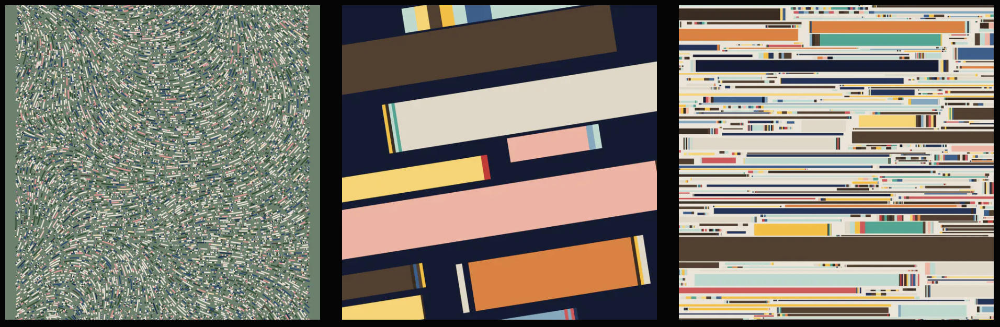

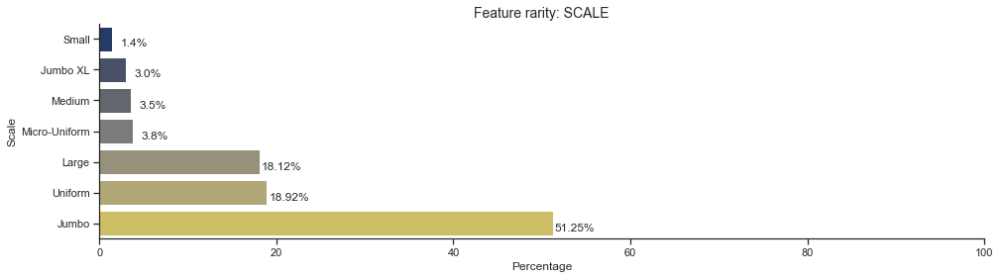

In [16]:
plot_feature_rarity('Scale', (16,4))

**COLORS**


The super rares: Party Time - White on Cream - Dark Lifestyle 

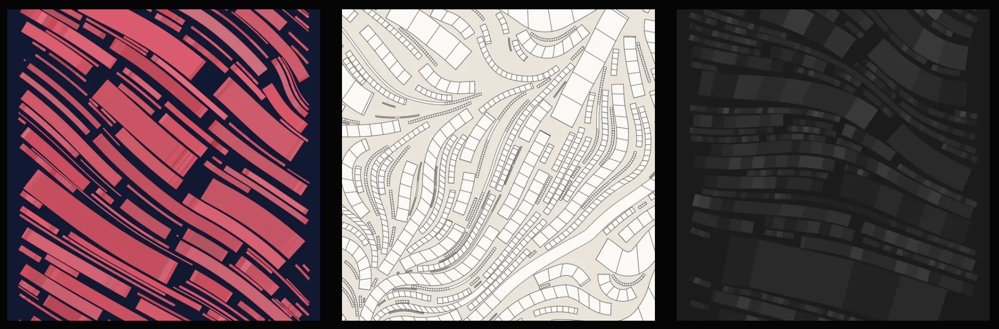

And the not-so-rares: Luxe - Golf Socks - Rad

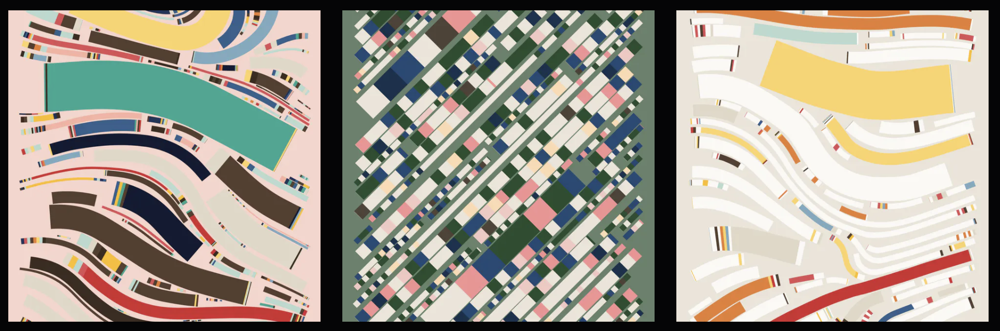

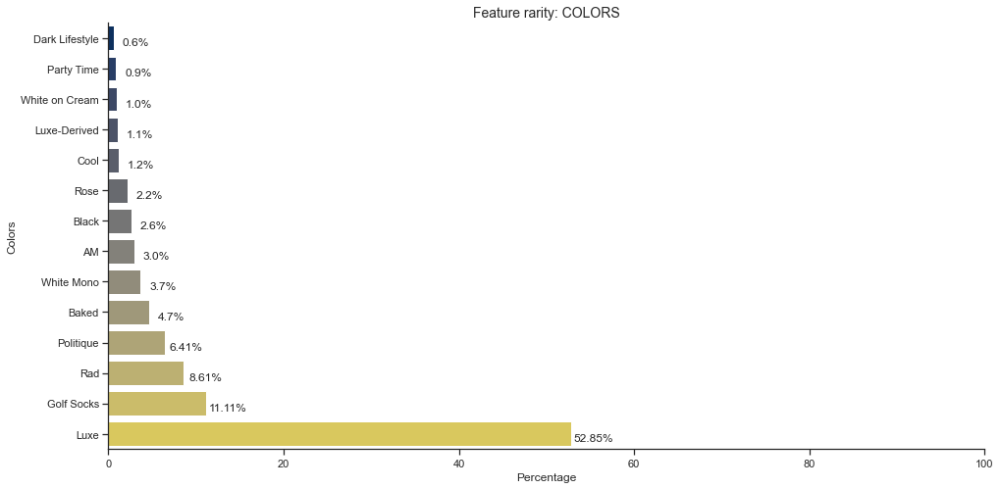

In [17]:
plot_feature_rarity('Colors', (16,8))

**DENSITY**

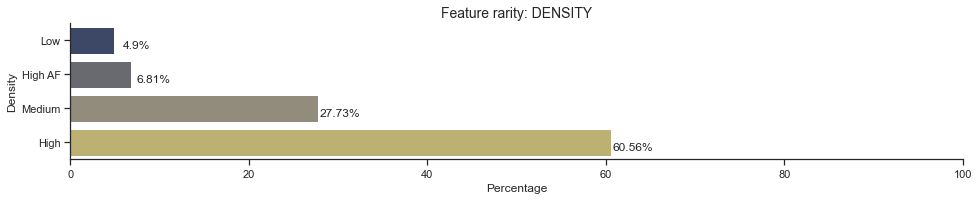

In [18]:
plot_feature_rarity('Density', (16,2.5))

**TURBULENCE**

Seen here: High - Medium - None

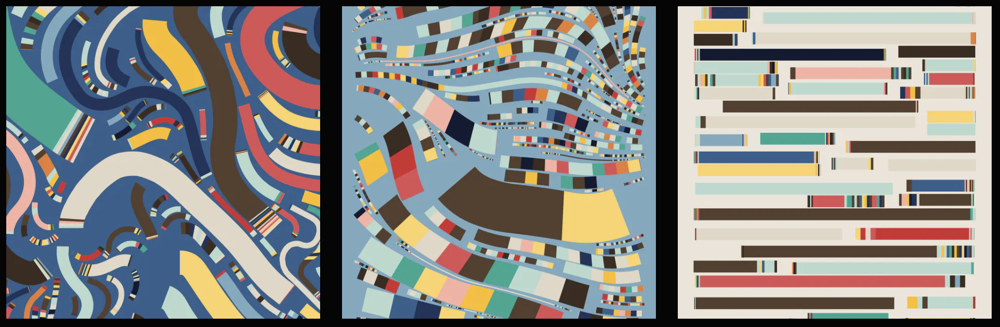

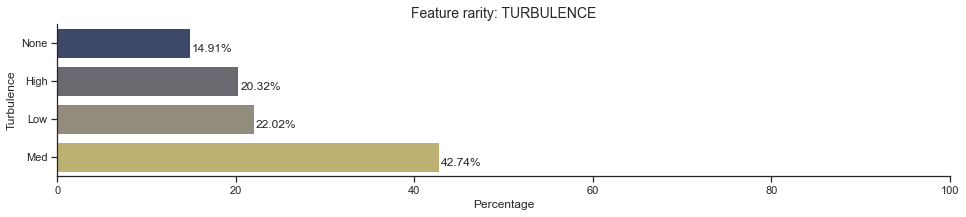

In [19]:
plot_feature_rarity('Turbulence', (16,2.8))

**SPIRAL**

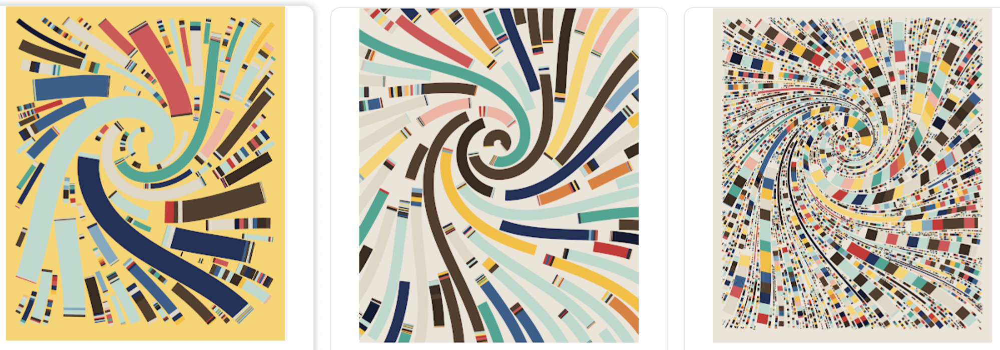

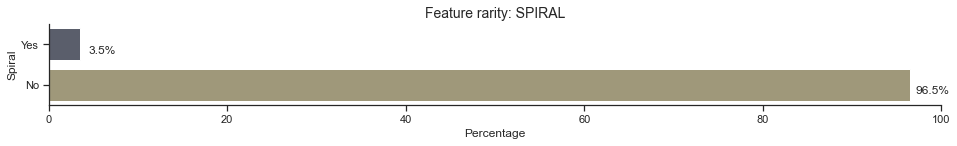

In [20]:
plot_feature_rarity('Spiral', (16,1.5))

**COLLISION CHECK**

Seen here: Relaxed - No Overlap - Anything Goes

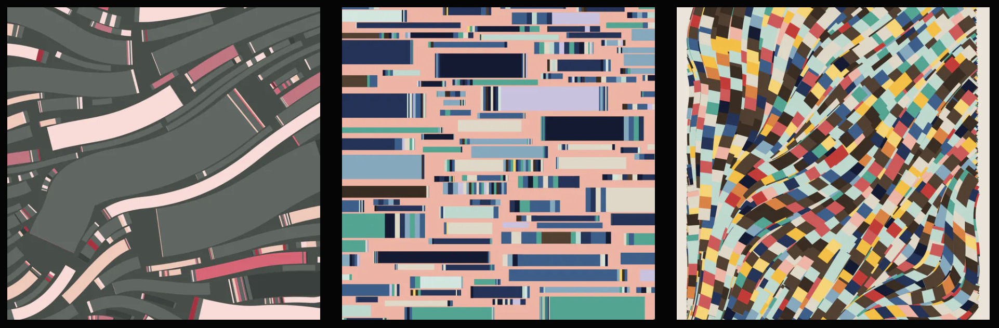

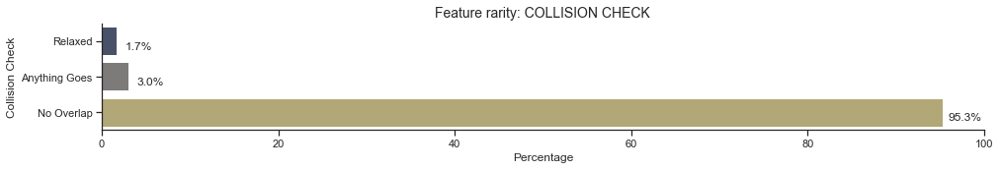

In [21]:
plot_feature_rarity('Collision Check', (16,2))

**Features with low variety**

In [22]:
# for features with low variety
def plot_2_features(feature_1, feature_2):
    sns.set_style('ticks')
    sns.set_palette('cividis', 2)
    fig,ax = plt.subplots(1, 2, figsize=(16,1.5))

    for i, feature in zip ([0,1], [feature_1, feature_2]):
        rarity = get_feature_rarity(feature)
        sns.barplot(y=rarity[feature], x=rarity['Percentage'], data=rarity, ax=ax[i])
        ax[i].set_title('Feature rarity: {}'.format(str.upper(feature)))

        # annotation
        for p in ax[i].patches:
            h, w, y = p.get_height(), p.get_width(), p.get_y()
            xy = ((w + 6.5), h + (y-0.35))
            text = str(w) + "%"
            ax[i].annotate(text=text, xy=xy, ha='center', va='center')
        ax[i].set_xlim(0,100)

    sns.despine()
    plt.show()

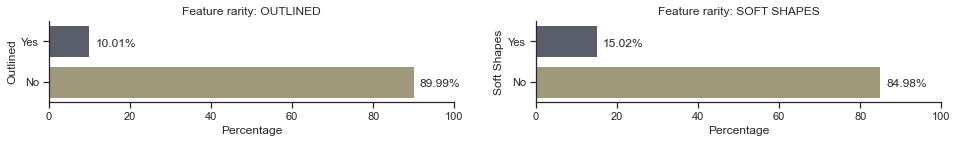

In [23]:
plot_2_features('Outlined', 'Soft Shapes')

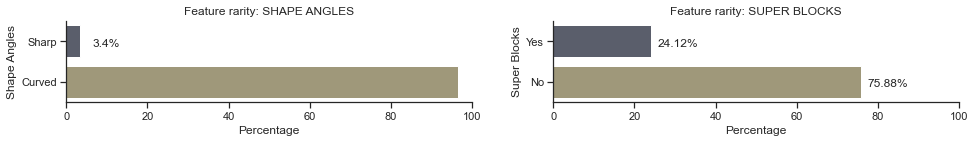

In [24]:
plot_2_features('Shape Angles', 'Super Blocks')

### 3. Rarity scores
- Tested rarity scores used by rarity.tools: https://rarity.tools/
- Calculation explained here: https://raritytools.medium.com/ranking-rarity-understanding-rarity-calculation-methods-86ceaeb9b98c

#### Single trait rarity
- Ranking by the rarest trait of each NFT. 
- Short-coming: an NFT having 1 super rare trait will overtake those with multiple less rare traits.

In [25]:
fdz.head(3)

,token_id,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check
0,78000000,Large,Golf Socks,No,Medium,No,Med,Yes,No,Curved,Yes,No Overlap
1,78000001,Jumbo,Luxe,No,High,No,Med,No,No,Curved,No,No Overlap
2,78000002,Jumbo,White Mono,No,High,No,None,No,No,Curved,No,No Overlap


In [26]:
for feature in fdz.columns[1:].to_list():
    feature_rarity = get_feature_rarity(feature)
    fdz = pd.merge(fdz, feature_rarity, on=feature, how='left')
    fdz.rename(columns={'Percentage':'{}_freq'.format(feature)}, inplace=True)

In [27]:
fdz.head(10)

,token_id,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check,Scale_freq,Colors_freq,Spiral_freq,Density_freq,Outlined_freq,Turbulence_freq,Have Margin_freq,Soft Shapes_freq,Shape Angles_freq,Super Blocks_freq,Collision Check_freq
0,78000000,Large,Golf Socks,No,Medium,No,Med,Yes,No,Curved,Yes,No Overlap,18.12,11.11,96.5,27.73,89.99,42.74,57.26,84.98,96.6,24.12,95.3
1,78000001,Jumbo,Luxe,No,High,No,Med,No,No,Curved,No,No Overlap,51.25,52.85,96.5,60.56,89.99,42.74,42.74,84.98,96.6,75.88,95.3
2,78000002,Jumbo,White Mono,No,High,No,None,No,No,Curved,No,No Overlap,51.25,3.70,96.5,60.56,89.99,14.91,42.74,84.98,96.6,75.88,95.3
3,78000003,Uniform,Luxe,No,Low,No,Low,Yes,No,Curved,No,No Overlap,18.92,52.85,96.5,4.90,89.99,22.02,57.26,84.98,96.6,75.88,95.3
4,78000004,Large,Baked,No,Medium,No,Low,Yes,Yes,Curved,No,No Overlap,18.12,4.70,96.5,27.73,89.99,22.02,57.26,15.02,96.6,75.88,95.3
5,78000005,Jumbo,Politique,No,High,No,Med,Yes,No,Curved,No,Relaxed,51.25,6.41,96.5,60.56,89.99,42.74,57.26,84.98,96.6,75.88,1.7
6,78000006,Jumbo,Party Time,No,High,No,Med,No,No,Curved,No,No Overlap,51.25,0.90,96.5,60.56,89.99,42.74,42.74,84.98,96.6,75.88,95.3
7,78000007,Jumbo,Politique,No,High,No,None,Yes,Yes,Curved,No,No Overlap,51.25,6.41,96.5,60.56,89.99,14.91,57.26,15.02,96.6,75.88,95.3
8,78000008,Large,Luxe,No,Medium,No,Low,Yes,Yes,Curved,No,No Overlap,18.12,52.85,96.5,27.73,89.99,22.02,57.26,15.02,96.6,75.88,95.3
9,78000009,Micro-Uniform,Luxe,No,High AF,No,Low,Yes,No,Curved,No,No Overlap,3.80,52.85,96.5,6.81,89.99,22.02,57.26,84.98,96.6,75.88,95.3


In [28]:
feature_cols = fdz.columns[1:12]
rarity_cols = fdz.columns[12:]

**Rarest feature per token**

In [29]:
fdz['rarest_trait'] = fdz[rarity_cols].idxmin(axis=1).str[:-5]

**Single feature rarity scores: 3 lowest frequencies**

In [30]:
# fdz['single_rarity_score'] = fdz[rarity_cols].min(axis=1)

In [31]:
single_trait_rarity = pd.DataFrame(np.sort(fdz[rarity_cols])[:, :3],
                         columns = ['single_trait_rarity_1st', 'single_trait_rarity_2d', 'single_trait_rarity_3rd'])
single_trait_rarity.head(3)

,single_trait_rarity_1st,single_trait_rarity_2d,single_trait_rarity_3rd
0,11.11,18.12,24.12
1,42.74,42.74,51.25
2,3.70,14.91,42.74


In [32]:
fdz = pd.concat([fdz, single_trait_rarity], axis=1)
fdz.head(3)

,token_id,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check,Scale_freq,Colors_freq,Spiral_freq,Density_freq,Outlined_freq,Turbulence_freq,Have Margin_freq,Soft Shapes_freq,Shape Angles_freq,Super Blocks_freq,Collision Check_freq,rarest_trait,single_trait_rarity_1st,single_trait_rarity_2d,single_trait_rarity_3rd
0,78000000,Large,Golf Socks,No,Medium,No,Med,Yes,No,Curved,Yes,No Overlap,18.12,11.11,96.5,27.73,89.99,42.74,57.26,84.98,96.6,24.12,95.3,Colors,11.11,18.12,24.12
1,78000001,Jumbo,Luxe,No,High,No,Med,No,No,Curved,No,No Overlap,51.25,52.85,96.5,60.56,89.99,42.74,42.74,84.98,96.6,75.88,95.3,Turbulence,42.74,42.74,51.25
2,78000002,Jumbo,White Mono,No,High,No,None,No,No,Curved,No,No Overlap,51.25,3.70,96.5,60.56,89.99,14.91,42.74,84.98,96.6,75.88,95.3,Colors,3.70,14.91,42.74


**Rankings by single rarity score**

In [33]:
fdz[['token_id', 'single_trait_rarity_1st', 'rarest_trait']].\
        sort_values(by='single_trait_rarity_1st', ascending=True)[:10]

,token_id,single_trait_rarity_1st,rarest_trait
553,78000553,0.6,Colors
371,78000371,0.6,Colors
531,78000531,0.6,Colors
662,78000662,0.6,Colors
665,78000665,0.6,Colors
723,78000723,0.6,Colors
31,78000031,0.9,Colors
61,78000061,0.9,Colors
267,78000267,0.9,Colors
237,78000237,0.9,Colors


***Observations:***
- Tokens with the same rarest trait will have the same ranking, no matter what other traits are.
- The distribution of each feature drives the rarity scores. For example, the rarest 'color' accounts for 0.6% of the collection, making it the rarest feature across all features values

#### Further exploration: Rarity by all traits
- Refers to the frequency of having certain combination of traits within the collection.
- Short-coming: some features may have bigger impact on prices than others.

### 4. Rarity & prices

Hypotheses:
- Single feature rarity does have an impact on prices.
- Some features may have bigger impact on prices than others.
- Given the same trait, as the scarcity discrepancy gets bigger, so as the price gaps.

Metrics used:
- Prices: average/min/max prices of items having the same trait.
- Time frame: last 6 months. (

Dataset:
- This analysis uses data extracted from Dune Analytics, covering all Art Blocks Curated trades until Dec 5th.
- The dataset excludes bundle trades.

SQL query on Dune:

    SELECT 
        block_time, nft_project_name, nft_token_id, usd_amount, 
        original_amount, original_currency
    FROM nft."trades"
    WHERE nft_contract_address = '\xa7d8d9ef8D8Ce8992Df33D8b8CF4Aebabd5bD270'
    AND trade_type = 'Single Item Trade'

**Art Blocks Curated trades**

In [34]:
path = str(os.getcwd()) + '/'
ABC_part_1 = pd.read_csv(path + 'ABC_trades_up_to_01_08_2021.csv')
ABC_part_2 = pd.read_csv(path + 'ABC_trades_from_01_08_2021_now.csv')

In [35]:
ABC = pd.concat([ABC_part_1, ABC_part_2], ignore_index=True)

In [36]:
ABC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113567 entries, 0 to 113566
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   block_time         113567 non-null  object 
 1   nft_project_name   113567 non-null  object 
 2   nft_token_id       113567 non-null  int64  
 3   usd_amount         113437 non-null  float64
 4   original_amount    113567 non-null  float64
 5   original_currency  113567 non-null  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 5.2+ MB


**Fidenza trades**

In [37]:
fdz_trades = ABC.loc[ABC['nft_token_id'].isin(np.arange(78000000, 78000999))]

In [38]:
fdz_trades.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1102 entries, 9917 to 113405
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   block_time         1102 non-null   object 
 1   nft_project_name   1102 non-null   object 
 2   nft_token_id       1102 non-null   int64  
 3   usd_amount         1102 non-null   float64
 4   original_amount    1102 non-null   float64
 5   original_currency  1102 non-null   object 
dtypes: float64(2), int64(1), object(3)
memory usage: 60.3+ KB


In [39]:
fdz_trades.head(3)

,block_time,nft_project_name,nft_token_id,usd_amount,original_amount,original_currency
9917,2021-06-11T16:06:36+00:00,Art Blocks Curated,78000110,1093.8870,0.45,ETH
9918,2021-06-11T16:10:03+00:00,Art Blocks Curated,78000446,704.9494,0.29,ETH
9919,2021-06-11T16:10:32+00:00,Art Blocks Curated,78000460,972.3440,0.40,ETH


In [40]:
# change usd_amount to integer
fdz_trades.loc[:, 'usd_amount'] = fdz_trades.loc[:, 'usd_amount'].astype(int)

# reset index
fdz_trades = fdz_trades.reset_index()

# drop project_name col & rename the token_id col
fdz_trades.drop(columns=['index', 'nft_project_name'], axis=1, inplace=True)
fdz_trades.rename(columns={'nft_token_id': 'token_id'}, inplace=True)

/Users/trangvo/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [41]:
# use date only & change to timestamp
fdz_trades.loc[:, 'block_time'] = fdz_trades.loc[:, 'block_time'].str[:10]
fdz_trades['block_time'] = pd.to_datetime(fdz_trades['block_time'], format='%Y/%m/%d')

In [42]:
print('Fidenza first trade: ', fdz_trades['block_time'].dt.date.min())
print('Latest trade: ', fdz_trades['block_time'].dt.date.max())
print('Total number of Fidenza pieces traded: ', fdz_trades['token_id'].nunique())
print('Highest sale: ', fdz_trades['usd_amount'].divide(1000000).round(2).max(), ' million USD')
print('Most valuable piece: ', fdz_trades.loc[(fdz_trades['usd_amount'].idxmax()), 'token_id'])

Fidenza first trade:  2021-06-11
Latest trade:  2021-12-03
Total number of Fidenza pieces traded:  614
Highest sale:  3.35  million USD
Most valuable piece:  78000313


**Top sales**

In [43]:
fdz_trades.sort_values(by='usd_amount', ascending=False)[:5]

,block_time,token_id,usd_amount,original_amount,original_currency
995,2021-08-23,78000313,3346790,1000.0,ETH
1058,2021-09-30,78000077,2858502,950.0,ETH
1012,2021-08-25,78000772,2429997,777.0,ETH
922,2021-08-18,78000723,1997612,650.0,ETH
1039,2021-09-03,78000547,1819396,460.0,ETH


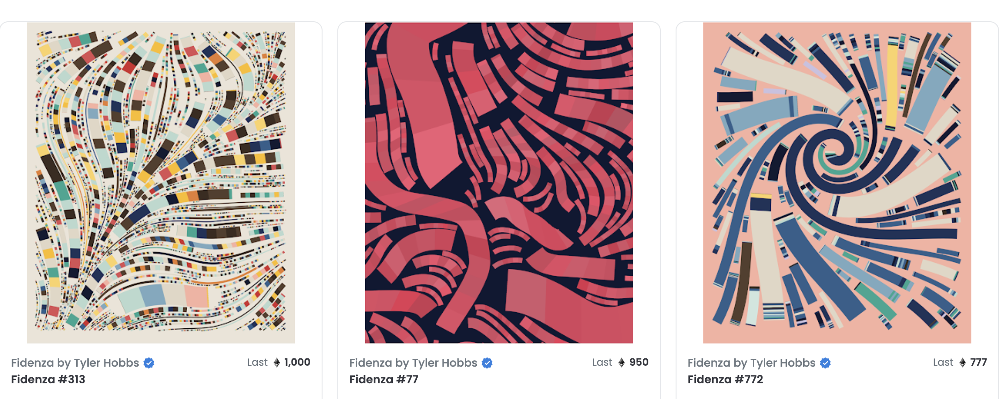

Sort tokens by number of trades:

In [44]:
trade_count = fdz_trades.groupby('token_id')['usd_amount'].count().sort_values(ascending=False).reset_index()
trade_count.rename(columns={'usd_amount': 'no_of_trades'}, inplace=True)

Select tokens which are traded at least twice: 300/999 tokens selected 

In [45]:
trade_count = trade_count.loc[trade_count['no_of_trades'] > 1]
trade_count.tail(3)

,token_id,no_of_trades
298,78000297,2
299,78000878,2
300,78000854,2


Sort tokens by max_price:

In [46]:
token_max_price = fdz_trades.groupby('token_id')['usd_amount'].max().sort_values(ascending=False).reset_index()
token_max_price.rename(columns={'usd_amount': 'max_price'}, inplace=True)
token_max_price.head(3)

,token_id,max_price
0,78000313,3346790
1,78000077,2858502
2,78000772,2429997


Sort tokens by minimum price:

In [47]:
token_min_price = fdz_trades.groupby('token_id')['usd_amount'].min().sort_values(ascending=False).reset_index()
token_min_price.rename(columns={'usd_amount': 'min_price'}, inplace=True)
token_min_price.head(3)

,token_id,min_price
0,78000529,1607935
1,78000647,1037697
2,78000250,986736


Sort tokens by average price:

In [48]:
token_avg_price = fdz_trades.groupby('token_id')['usd_amount'].mean().round(2).sort_values(ascending=False).reset_index()
token_avg_price.rename(columns={'usd_amount': 'average_price'}, inplace=True)
token_avg_price.head(3)

,token_id,average_price
0,78000313,1674097.0
1,78000529,1607935.0
2,78000077,1477515.5


**Put all trade info per token together:**

In [49]:
fdz_selected = pd.merge(trade_count, token_max_price, on='token_id', how='left')
fdz_selected = pd.merge(fdz_selected, token_min_price, on='token_id', how='left')
fdz_selected = pd.merge(fdz_selected, token_avg_price, on='token_id', how='left')
fdz_selected.head()

,token_id,no_of_trades,max_price,min_price,average_price
0,78000473,7,590004,946,275455.00
1,78000089,6,554457,839,202745.83
2,78000189,6,483380,792,181743.17
3,78000165,6,118983,722,43879.33
4,78000601,6,140274,719,29531.50


**Token metadata & trade info:**

In [50]:
fdz.head(3)

,token_id,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check,Scale_freq,Colors_freq,Spiral_freq,Density_freq,Outlined_freq,Turbulence_freq,Have Margin_freq,Soft Shapes_freq,Shape Angles_freq,Super Blocks_freq,Collision Check_freq,rarest_trait,single_trait_rarity_1st,single_trait_rarity_2d,single_trait_rarity_3rd
0,78000000,Large,Golf Socks,No,Medium,No,Med,Yes,No,Curved,Yes,No Overlap,18.12,11.11,96.5,27.73,89.99,42.74,57.26,84.98,96.6,24.12,95.3,Colors,11.11,18.12,24.12
1,78000001,Jumbo,Luxe,No,High,No,Med,No,No,Curved,No,No Overlap,51.25,52.85,96.5,60.56,89.99,42.74,42.74,84.98,96.6,75.88,95.3,Turbulence,42.74,42.74,51.25
2,78000002,Jumbo,White Mono,No,High,No,None,No,No,Curved,No,No Overlap,51.25,3.70,96.5,60.56,89.99,14.91,42.74,84.98,96.6,75.88,95.3,Colors,3.70,14.91,42.74


In [51]:
fdz_full = pd.merge(fdz, fdz_selected, on='token_id', how='inner')
fdz_full.head(3)

,token_id,Scale,Colors,Spiral,Density,Outlined,Turbulence,Have Margin,Soft Shapes,Shape Angles,Super Blocks,Collision Check,Scale_freq,Colors_freq,Spiral_freq,Density_freq,Outlined_freq,Turbulence_freq,Have Margin_freq,Soft Shapes_freq,Shape Angles_freq,Super Blocks_freq,Collision Check_freq,rarest_trait,single_trait_rarity_1st,single_trait_rarity_2d,single_trait_rarity_3rd,no_of_trades,max_price,min_price,average_price
0,78000006,Jumbo,Party Time,No,High,No,Med,No,No,Curved,No,No Overlap,51.25,0.90,96.5,60.56,89.99,42.74,42.74,84.98,96.6,75.88,95.3,Colors,0.9,42.74,42.74,2,1570379,4210,787294.5
1,78000021,Jumbo,White on Cream,No,High,Yes,None,Yes,No,Curved,No,No Overlap,51.25,1.00,96.5,60.56,10.01,14.91,57.26,84.98,96.6,75.88,95.3,Colors,1.0,10.01,14.91,2,182808,143122,162965.0
2,78000025,Jumbo,Luxe,No,High,No,Low,Yes,No,Curved,No,Anything Goes,51.25,52.85,96.5,60.56,89.99,22.02,57.26,84.98,96.6,75.88,3.0,Collision Check,3.0,22.02,51.25,2,199076,70894,134985.0


In [99]:
fdz_full[['single_trait_rarity_1st', 'min_price']].corr(method='pearson')

,single_trait_rarity_1st,min_price
single_trait_rarity_1st,1.000000,0.038547
min_price,0.038547,1.000000


### 5. Future steps

- Does NFT feature rarity correlate with listing prices?
- What are the correlations between different rarity scores and prices?
- What are the rarity characteristics of the most traded items & items with high price appreciation?